<a href="https://colab.research.google.com/github/nabilbelmir/Datadriven/blob/main/Copie_de_data_engineering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Task 1
Ranger les données en matrices

1 vecteur de 36 matrices 8x9

1 matrice de

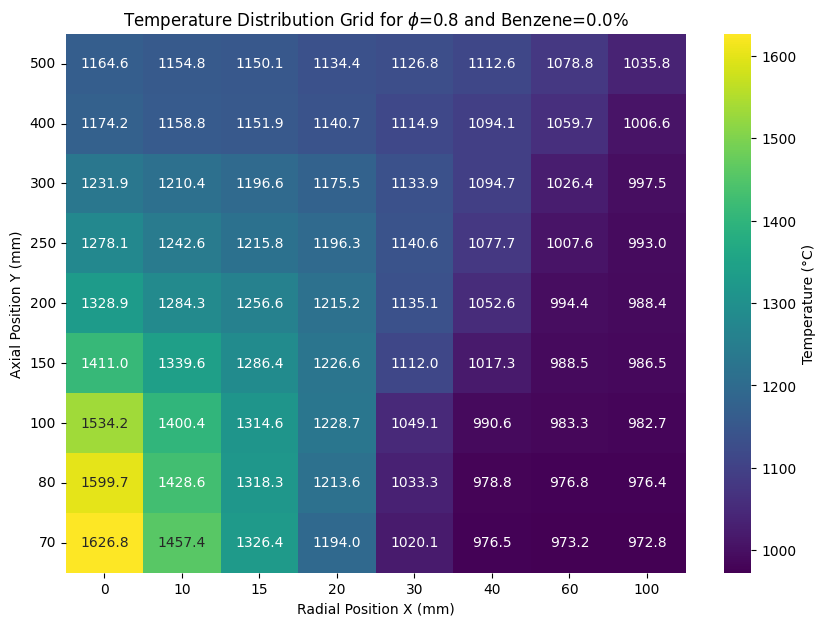

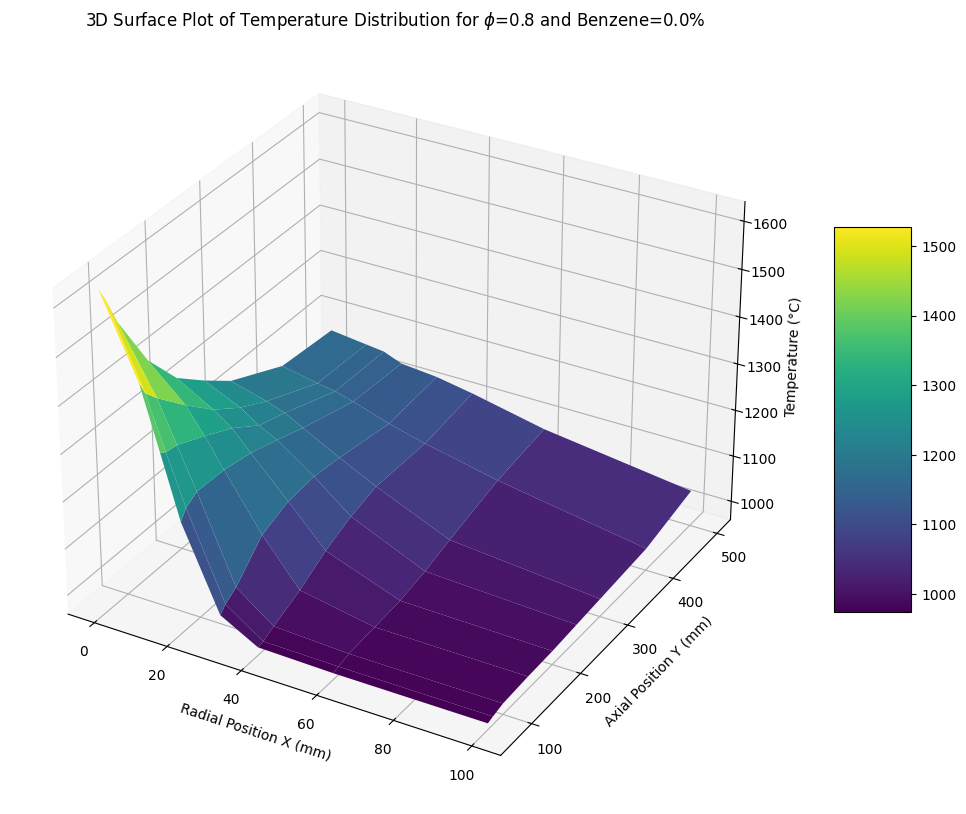

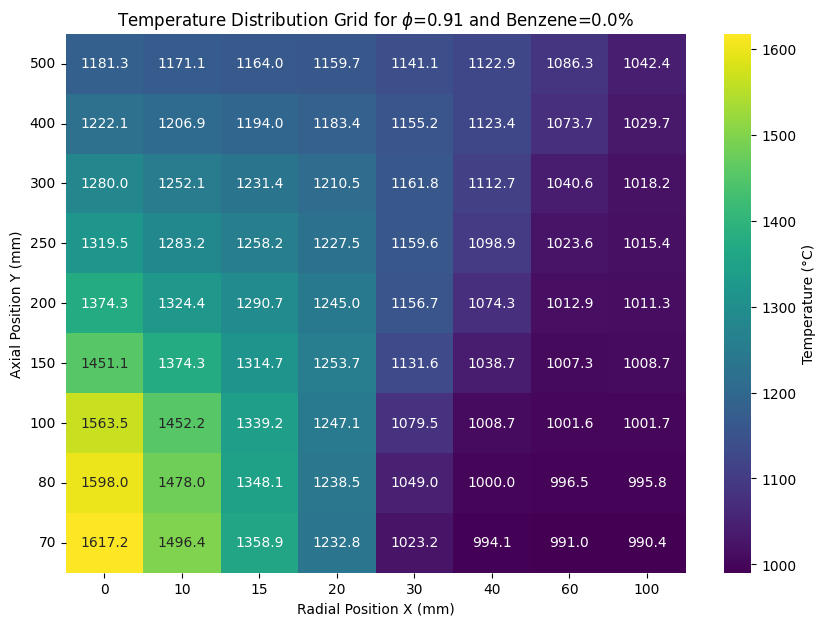

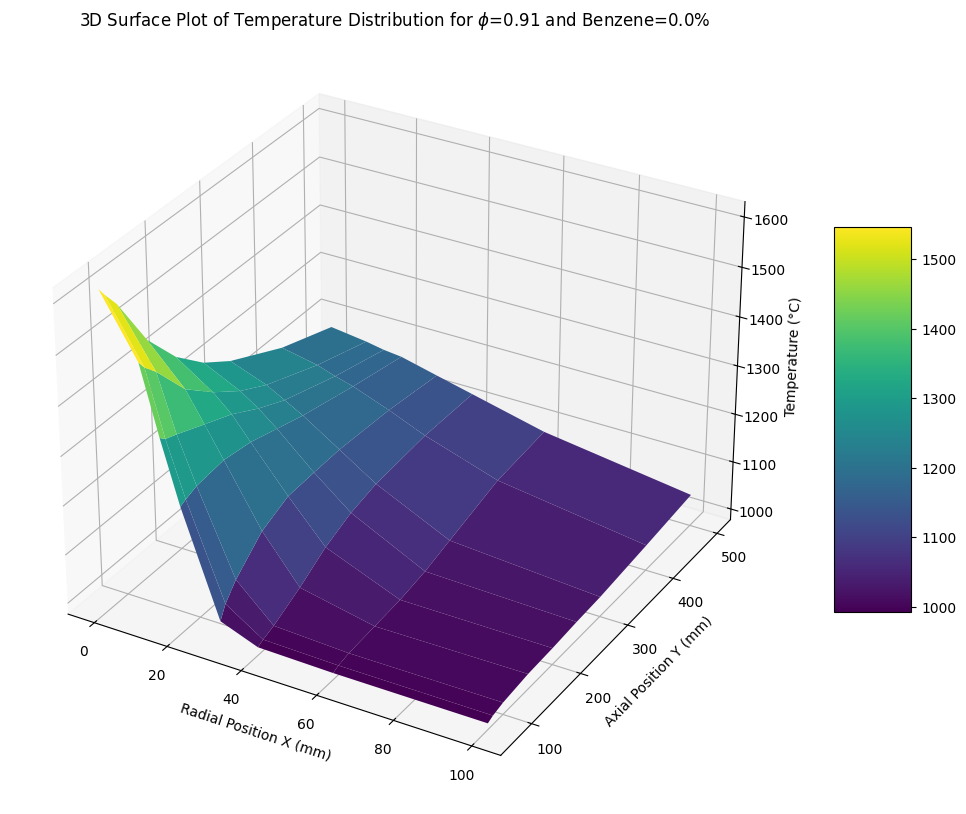

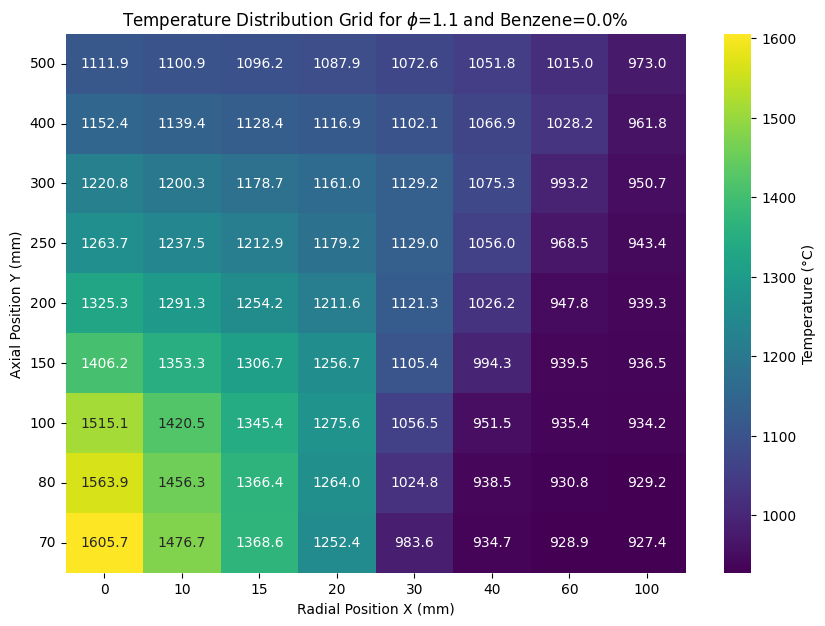

...

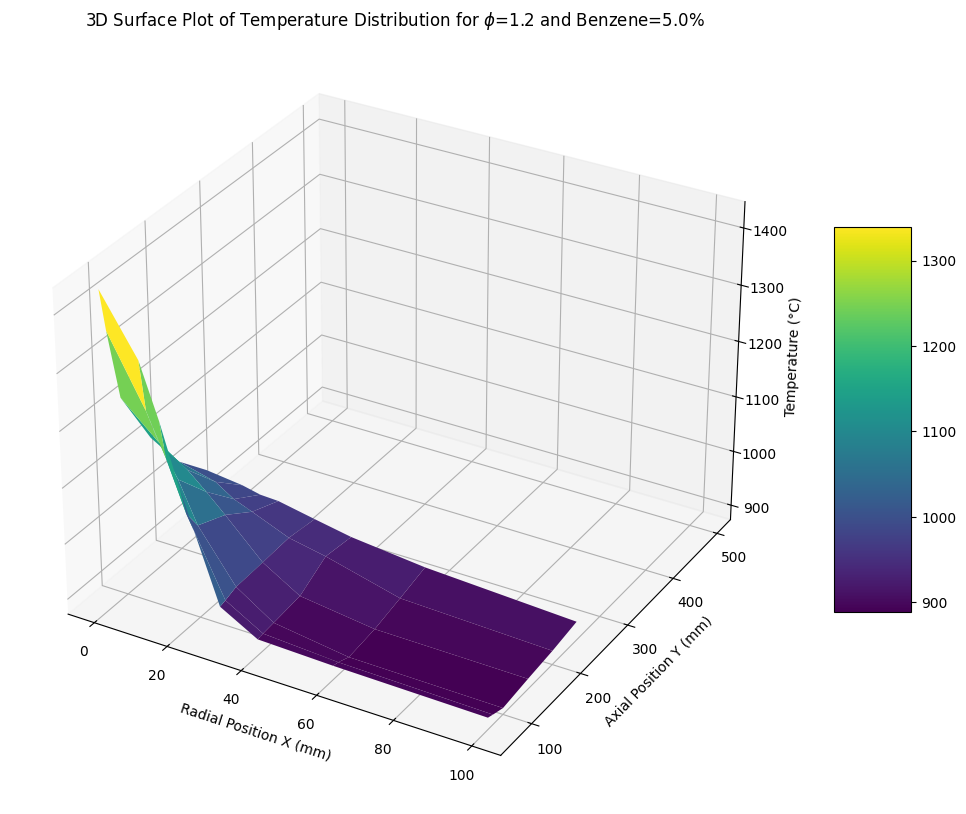

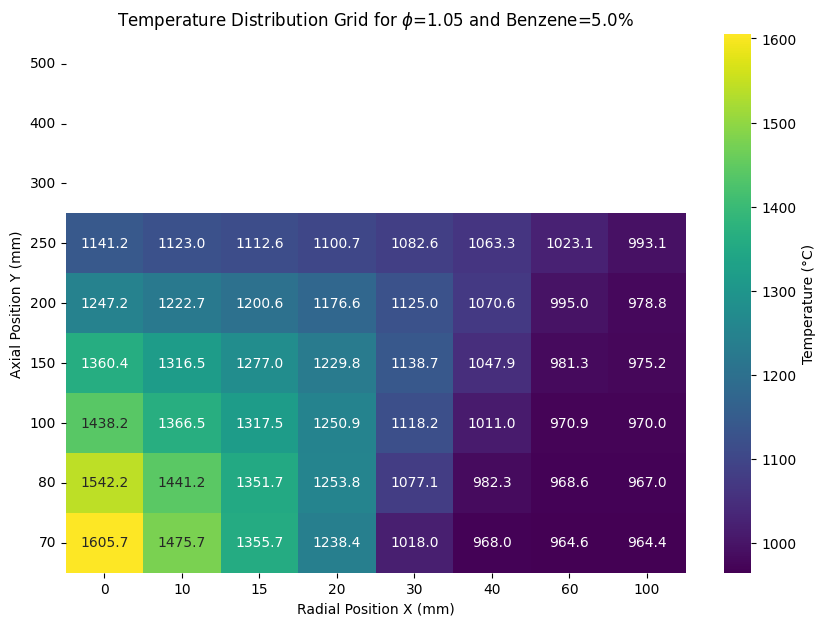

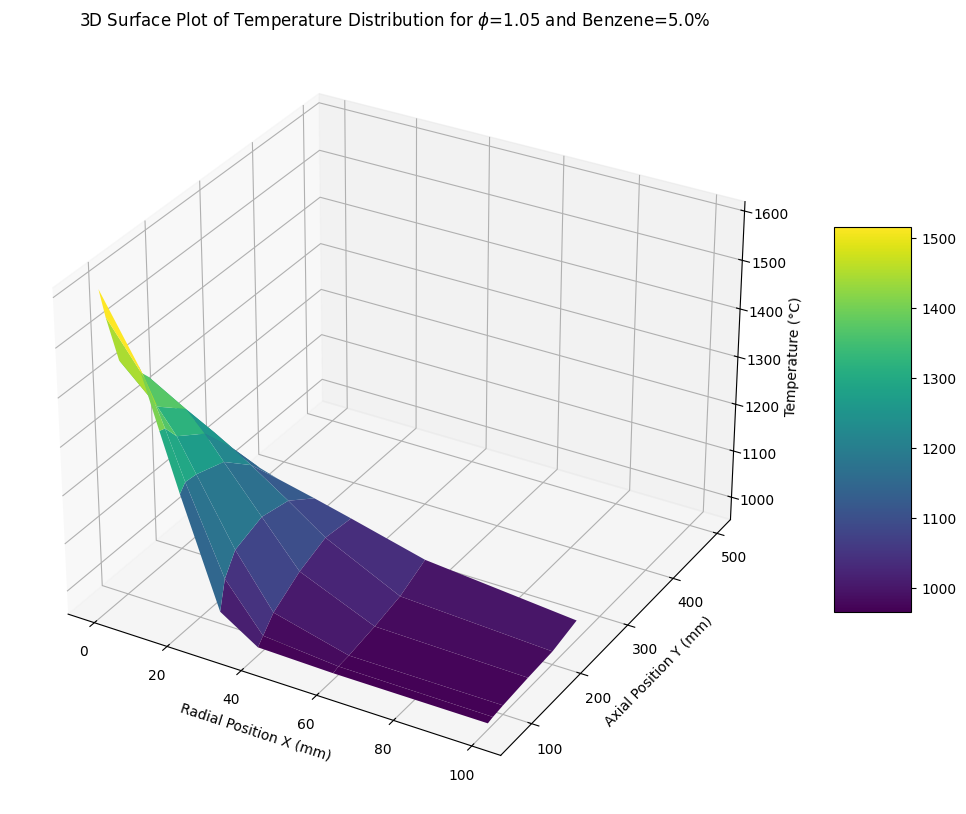

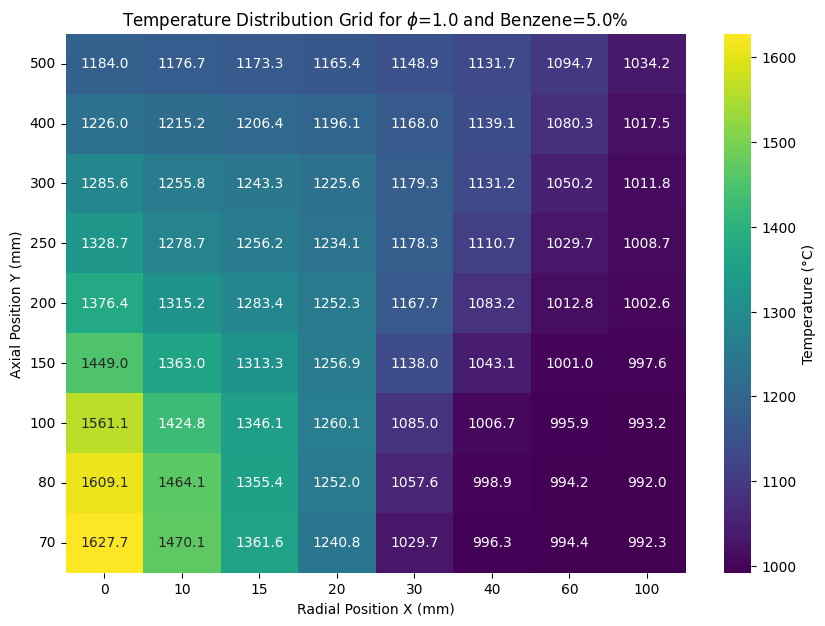

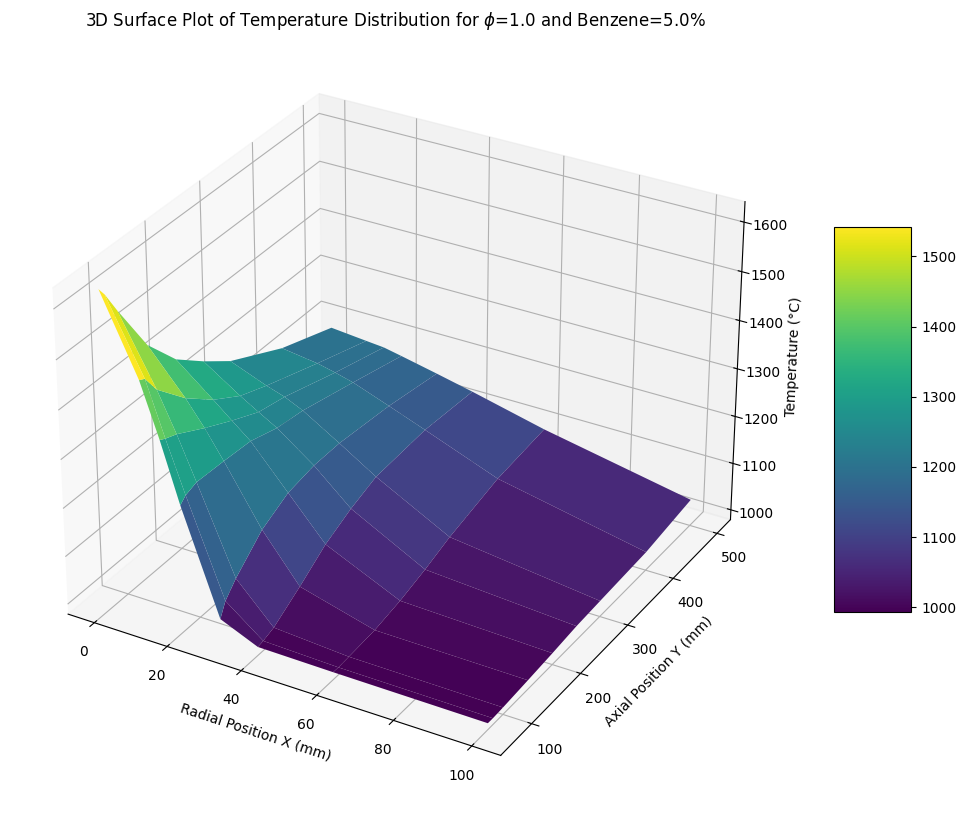

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Load the data
data = pd.read_csv('/content/Data_Benzene.csv', header=None)


# Function to reshape the data into the correct 9x8 format
def reshape_data(row):
    return np.array(row).reshape(9, 8)

# Define the physical dimensions for the grid
x_ticks = [0, 10, 15, 20, 30, 40, 60, 100]  # mm for X axis (Radial Position)
y_ticks = [70, 80, 100, 150, 200, 250, 300, 400, 500]  # mm for Y axis (Axial Position)

# Create a meshgrid for X and Y coordinates
X, Y = np.meshgrid(x_ticks, y_ticks)

# Loop through each experimental condition (each row in the CSV)
for index, row in data.iterrows():
    benzene = row.iloc[0]
    phi = row.iloc[1]  # Extract phi for the current row
    temp_data = reshape_data(row[2:])  # Reshape the temperature data for current row

    # Plotting the corrected heatmap
    plt.figure(figsize=(10, 7))
    ax = sns.heatmap(temp_data, annot=True, fmt=".1f", cmap="viridis", cbar_kws={'label': 'Temperature (°C)'})
    ax.set_title(f'Temperature Distribution Grid for $\phi$={phi} and Benzene={benzene}%')
    ax.set_xlabel('Radial Position X (mm)')
    ax.set_ylabel('Axial Position Y (mm)')
    ax.set_xticklabels(x_ticks)
    ax.set_yticklabels(y_ticks, rotation=0)
    ax.invert_yaxis()
    plt.show()

    # Create a 3D surface plot
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    surface = ax.plot_surface(X, Y, temp_data, cmap='viridis', edgecolor='none')
    ax.set_xlabel('Radial Position X (mm)')
    ax.set_ylabel('Axial Position Y (mm)')
    ax.set_zlabel('Temperature (°C)')
    ax.set_title(f'3D Surface Plot of Temperature Distribution for $\phi$={phi} and Benzene={benzene}%')
    fig.colorbar(surface, ax=ax, shrink=0.5, aspect=5)
    plt.show()

Task 1.5


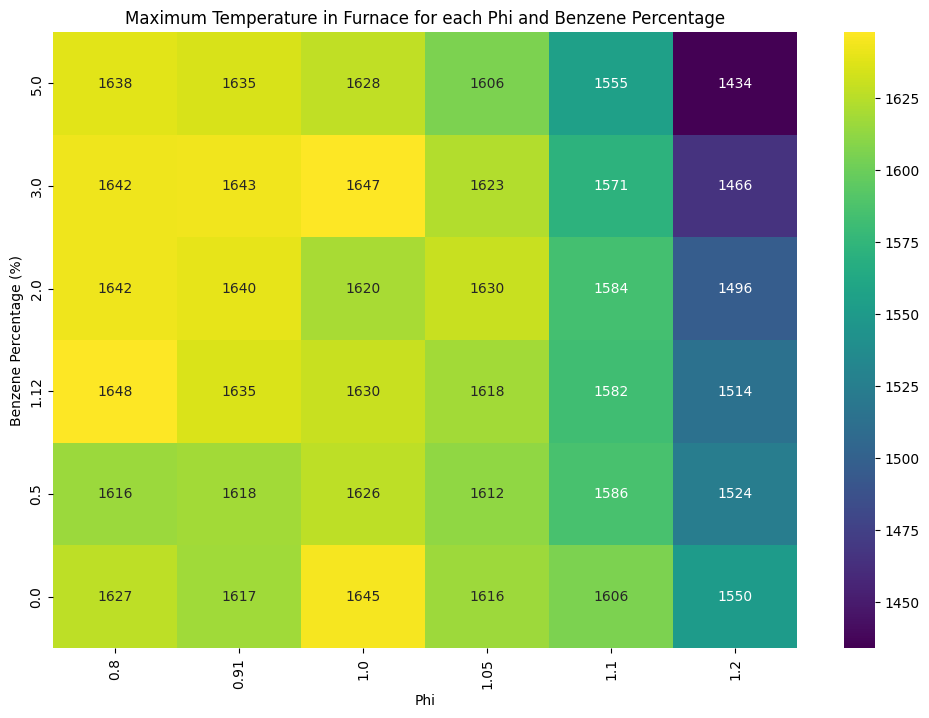

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset without headers
data = pd.read_csv('/content/Data_Benzene.csv', header=None)

# Assign column names based on the structure of your CSV
# First column is benzene percentage, second is phi, and the rest are temperatures
data.columns = ['Benzene_Percentage', 'Phi'] + [f'Temp{i}' for i in range(1, data.shape[1] - 1)]

# Calculate the maximum temperature for each row
data['Max_Temperature'] = data.iloc[:, 2:].max(axis=1)

# Filter data for benzene percentage from 0 to 5 and phi starting from 0.8
data_filtered = data[(data['Benzene_Percentage'] >= 0) & (data['Benzene_Percentage'] <= 5) & (data['Phi'] >= 0.8)]

# Create a pivot table with Benzene Percentage as rows, Phi as columns, and Max Temperature as values
pivot_table = data_filtered.pivot(index='Benzene_Percentage', columns='Phi', values='Max_Temperature')

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap='viridis')
plt.title('Maximum Temperature in Furnace for each Phi and Benzene Percentage')
plt.xlabel('Phi')
plt.ylabel('Benzene Percentage (%)')
plt.xticks(np.arange(0.5, len(pivot_table.columns), 1), pivot_table.columns, rotation=90)
plt.yticks(np.arange(0.5, len(pivot_table.index), 1), pivot_table.index)
plt.gca().invert_yaxis()  # Invert the y-axis to have 0 at the bottom
plt.show()




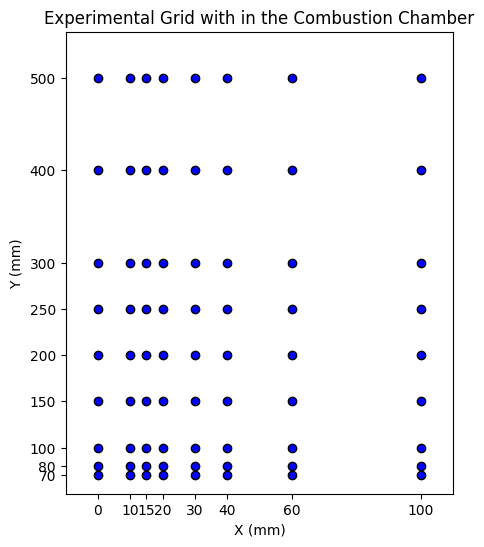

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Given coordinates for the grid
x_coords = [0, 10, 15, 20, 30, 40, 60, 100]
y_coords = [70, 80, 100, 150, 200, 250, 300, 400, 500]

# Since the grid has points at every combination of x and y, use meshgrid to create those points
X, Y = np.meshgrid(x_coords, y_coords)
X = X.flatten()
Y = Y.flatten()

# Create the scatter plot with a more elongated Y axis
fig, ax = plt.subplots(figsize=(5, 6))  # Adjust figure size
ax.scatter(X, Y, color='blue', edgecolor='k')  # Added edgecolor for better visibility

# Set the limits with extra space on each side
ax.set_xlim(min(x_coords) - 10, max(x_coords) + 10)
ax.set_ylim(min(y_coords) - 20, max(y_coords) + 50)

# Set the ticks at the data point locations
ax.set_xticks(x_coords)
ax.set_yticks(y_coords)

# Set the labels and title
ax.set_title('Experimental Grid with in the Combustion Chamber')
ax.set_xlabel('X (mm)')
ax.set_ylabel('Y (mm)')

# Optional: Add grid lines for better visibility


# Optional: Set aspect ratio to 'equal' for equal scaling
# ax.set_aspect('equal')

# Show the plot
plt.show()


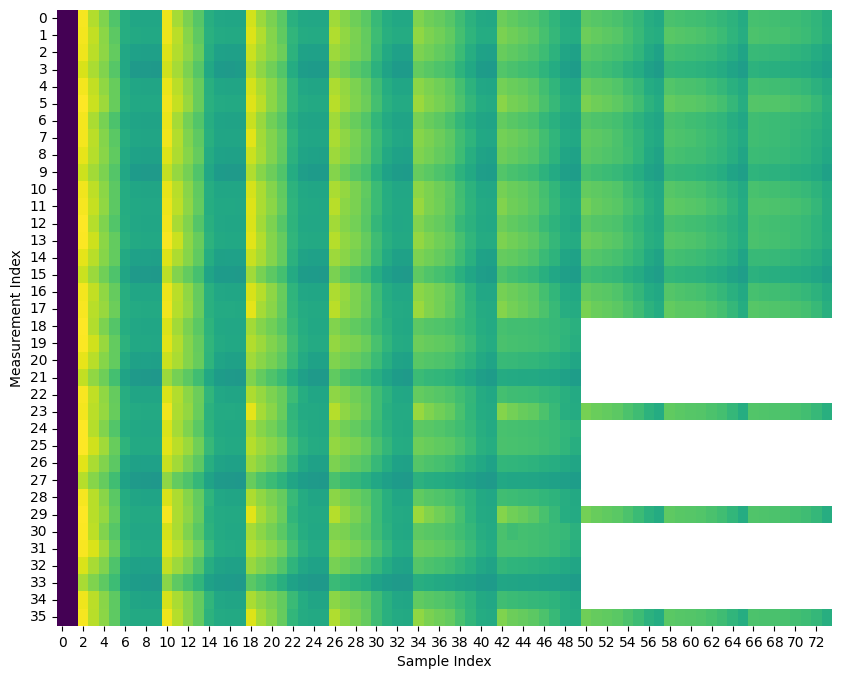

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data, assuming missing values are represented as NaN
data = pd.read_csv('/content/Data_Benzene.csv', header=None)

# Create a mask for missing values
missing_data_mask = data.isnull()

# Plot the heatmap with the mask
plt.figure(figsize=(10, 8))
sns.heatmap(data, mask=missing_data_mask, cmap='viridis', cbar=False)
#plt.title('Visualization of Missing Data')
plt.xlabel('Sample Index')
plt.ylabel('Measurement Index')
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np


# Load data
file_path = '/content/Dataa_Benzene1.csv'  # Make sure to update this path
data = pd.read_csv(file_path, header=None, delimiter=';')

# Convert all data to numeric, coercing errors to NaN, and then handle missing values
data = data.apply(pd.to_numeric, errors='coerce')
data.dropna(inplace=True)  # This drops rows with any NaN values; adjust as necessary


# Standardize the data
scaler = StandardScaler()
data_standardized = scaler.fit_transform(data.iloc[:, :])

# Initialize PCA with 3 components
pca = PCA(n_components=10)
pca.fit(data_standardized)

# Extract the eigenvalues and the explained variance
eigenvalues = pca.explained_variance_
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance) * 100

# Plotting eigenvalues
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, 'o-')
plt.title('Eigenvalue Magnitude Test')
plt.xlabel('Component index')
plt.ylabel('Eigenvalue')
plt.xticks(range(1, len(eigenvalues) + 1))  # Ensure ticks start at 1

# Plotting explained variance
plt.subplot(1, 2, 2)
bar_width = 0.35
index = np.arange(len(explained_variance))
bar1 = plt.bar(index, explained_variance * 100, bar_width, label='Individual')
bar2 = plt.plot(cumulative_variance, label='Cumulative', marker='o', color='blue')

plt.title('Variance Explained (%)')
plt.xlabel('Component index')
plt.ylabel('Percentage')
plt.xticks(index, [f'{i+1}' for i in index])  # x labels are component indices starting at 1
plt.legend()

plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/Dataa_Benzene1.csv'

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler



# Perform PCA
pca = PCA(n_components=3)  # You can change the number of components
principal_components = pca.fit_transform(data_standardized)

# Amount of variance explained by each of the selected components
explained_variance = pca.explained_variance_ratio_

# Output the principal components and explained variance
print("Principal Components:\n", principal_components)
print("\nExplained Variance:", explained_variance)


In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming 'data_standardized' and 'pca' are already defined and PCA has been fit with n_components=3

#

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot using the first three principal components
ax.scatter(principal_components[:, 0], principal_components[:, 1], principal_components[:, 2])

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D Scatter plot of Data Projected onto the First Three Principal Components')

plt.show()


In [ ]:
import matplotlib.pyplot as plt



# Create plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plotting data on the first and second principal components
ax1.scatter(principal_components[:, 0], principal_components[:, 1], color='blue')
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')
ax1.set_title('Projection on Principal Components 1 and 2')

#Plotting data on the second and third principal components
ax2.scatter(principal_components[:, 1], principal_components[:, 2], color='green')
ax2.set_xlabel('Principal Component 2')
ax2.set_ylabel('Principal Component 3')
ax2.set_title('Projection on Principal Components 2 and 3')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


loadings = pca.components_

# Create a DataFrame of loadings
loadings_df = pd.DataFrame(loadings.T, columns=['PC1', 'PC2', 'PC3'])

# Plotting the loadings
fig, ax = plt.subplots(figsize=(10, 6))
loadings_df.plot(kind='bar', ax=ax)
ax.set_title('PCA Loadings')
ax.set_ylabel('Loading Value')
ax.axhline(0, color='grey', linewidth=0.5)
plt.show()

# Analyze loadings
print("Loadings:\n", loadings_df)


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler



# Squaring the loadings
loadings_squared = np.square(loadings)

# Creating a DataFrame for easier plotting
loadings_squared_df = pd.DataFrame(loadings_squared.T, columns=['PC1', 'PC2', 'PC3'])

# Plotting the squared loadings
ax = loadings_squared_df.plot(kind='bar', figsize=(12, 8), colormap='viridis')
ax.set_title('Squared Loadings per Principal Component')
ax.set_xlabel('Variables')
ax.set_ylabel('Squared Loadings')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming 'pca' is already defined and fitted with n_components=3
# Loadings are the principal axes in feature space, showing the directions of maximum variance
loadings = pca.components_.T

# Names of the variables for labeling purposes (replace with your actual variable names)
feature_names = ['%b','phi', 't11', 't21', 't31', 't41', 't51', 't61', 't71', 't81', 't12', 't22', 't32', 't42', 't52', 't62', 't72', 't82', 't13', 't23', 't33', 't43', 't53', 't63', 't73', 't83', 't14', 't24', 't34', 't44', 't54', 't64', 't74', 't84', 't15', 't25', 't35', 't45', 't55', 't65', 't75', 't85', 't16', 't26', 't36', 't46', 't56', 't66', 't76', 't86']


# Create plots
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Loading plot for PC1 and PC2
for i in range(loadings.shape[0]):
    axes[0].plot([0, loadings[i, 0]], [0, loadings[i, 1]], color='blue', linewidth=2)  # Line for loading
    axes[0].text(loadings[i, 0], loadings[i, 1], feature_names[i], color='blue', ha='center', va='center')

axes[0].axhline(0, color='grey', linestyle='--', linewidth=0.5)
axes[0].axvline(0, color='grey', linestyle='--', linewidth=0.5)
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].set_title('Loading Plot for PC1 and PC2')
axes[0].set_xlim(-0.3, 0.3)
axes[0].set_ylim(-0.4, 0.3)

# Loading plot for PC2 and PC3
for i in range(loadings.shape[0]):
    axes[1].plot([0, loadings[i, 1]], [0, loadings[i, 2]], color='blue', linewidth=2)  # Line for loading
    axes[1].text(loadings[i, 1], loadings[i, 2], feature_names[i], color='blue', ha='center', va='center')

axes[1].axhline(0, color='grey', linestyle='--', linewidth=0.5)
axes[1].axvline(0, color='grey', linestyle='--', linewidth=0.5)
axes[1].set_xlabel('Principal Component 2')
axes[1].set_ylabel('Principal Component 3')
axes[1].set_title('Loading Plot for PC2 and PC3')
axes[1].set_xlim(-0.4, 0.3)
axes[1].set_ylim(-0.4, 0.3)

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import EmpiricalCovariance






# Calculate the center of the data in PCA space
center = np.mean(principal_components, axis=0)

# Calculate the covariance matrix of the PCA transformed data
cov_matrix = EmpiricalCovariance().fit(principal_components)

# Calculate the Mahalanobis distance for each data point
mahalanobis_distance = np.array([cov_matrix.mahalanobis((sample - center).reshape(1, -1)) for sample in principal_components])

# Determine the threshold for outliers
threshold = chi2.ppf((1-0.02), df=2)  # 98% confidence interval

# Identify outliers
outliers = mahalanobis_distance > threshold

# Ensure 'outliers' is a Boolean array that can be used for indexing (one-dimensional)
outliers = np.array(outliers).flatten()

# Plotting the results
plt.figure(figsize=(10, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], color='blue', alpha=0.5, label='Normal Data')
plt.scatter(principal_components[outliers, 0], principal_components[outliers, 1], color='red', marker='x', label='Outliers')
plt.title('PCA Plot with Outliers Highlighted')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

# Remove outliers
principal_components_cleaned = principal_components[~outliers]

print("Outliers detected:", np.sum(outliers))
print("Remaining data points:", principal_components_cleaned.shape[0])

# Repeat the process with the cleaned data

# Calculate the center of the cleaned data in PCA space
center_cleaned = np.mean(principal_components_cleaned, axis=0)

# Calculate the covariance matrix of the PCA transformed cleaned data
cov_matrix_cleaned = EmpiricalCovariance().fit(principal_components_cleaned)

# Calculate the Mahalanobis distance for each data point in the cleaned data
mahalanobis_distance_cleaned = np.array([cov_matrix_cleaned.mahalanobis((sample - center_cleaned).reshape(1, -1)) for sample in principal_components_cleaned])

# Determine the threshold for outliers in the cleaned data
threshold_cleaned = chi2.ppf((1-0.02), df=2)  # 98% confidence interval

# Identify outliers in the cleaned data
outliers_cleaned = mahalanobis_distance_cleaned > threshold_cleaned

# Ensure 'outliers_cleaned' is a Boolean array that can be used for indexing (one-dimensional)
outliers_cleaned = np.array(outliers_cleaned).flatten()

# Plotting the results for the cleaned data
plt.figure(figsize=(10, 6))
plt.scatter(principal_components_cleaned[:, 0], principal_components_cleaned[:, 1], color='blue', alpha=0.5, label='Normal Data')
plt.scatter(principal_components_cleaned[outliers_cleaned, 0], principal_components_cleaned[outliers_cleaned, 1], color='red', marker='x', label='Outliers')
plt.title('PCA Plot with Outliers Highlighted - Cleaned Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

# Remove outliers from the cleaned data
principal_components_final = principal_components_cleaned[~outliers_cleaned]

print("Outliers detected:", np.sum(outliers_cleaned))
print("Remaining data points:", principal_components_final.shape[0])




# Calculate the center of the cleaned data in PCA space
center_cleaned1 = np.mean(principal_components_final, axis=0)

# Calculate the covariance matrix of the PCA transformed cleaned data
cov_matrix_cleaned1 = EmpiricalCovariance().fit(principal_components_final)

# Calculate the Mahalanobis distance for each data point in the cleaned data
mahalanobis_distance_cleaned1 = np.array([cov_matrix_cleaned1.mahalanobis((sample - center_cleaned1).reshape(1, -1)) for sample in principal_components_final])

# Determine the threshold for outliers in the cleaned data
threshold_cleaned1 = chi2.ppf((1-0.04), df=2)  # 98% confidence interval

# Identify outliers in the cleaned data
outliers_cleaned1 = mahalanobis_distance_cleaned1 > threshold_cleaned1

# Ensure 'outliers_cleaned' is a Boolean array that can be used for indexing (one-dimensional)
outliers_cleaned1 = np.array(outliers_cleaned1).flatten()

# Plotting the results for the cleaned data
plt.figure(figsize=(10, 6))
plt.scatter(principal_components_final[:, 0], principal_components_final[:, 1], color='blue', alpha=0.5, label='Normal Data')
plt.scatter(principal_components_final[outliers_cleaned1, 0], principal_components_final[outliers_cleaned1, 1], color='red', marker='x', label='Outliers')
plt.title('PCA Plot with Outliers Highlighted - Cleaned Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

# Remove outliers from the cleaned data
principal_components = principal_components_final[~outliers_cleaned1]

print("Outliers detected:", np.sum(outliers_cleaned1))
print("Remaining data points:", principal_components.shape[0])

data = data[~outliers]
data = data[~outliers_cleaned]
data = data[~outliers_cleaned1]


final_cleaned_data_path = '/content/Final_Cleaned_Data_Benzene1.csv'  # Update the path as necessary
data.to_csv(final_cleaned_data_path, index=False, header=False, sep=';')




In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score

X = principal_components

# Create the k_array and the db_score_array, initiliazed with zeros
k_array         = np.arange(2,10)
db_score_array  = np.zeros((k_array.size,))

# Loop on k where: 1) perform KMeans, 2) calculate db_score and 3) stores them in db_score_array
for i,k in enumerate(k_array):
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto')
    kmeans.fit(X)
    idx = kmeans.labels_

    db_score = davies_bouldin_score(X, idx)
    db_score_array[i] = db_score

# Plot DB score Vs n_clusters
plt.plot(k_array, db_score_array)
plt.xlabel('k')
plt.ylabel('db_score')
plt.show()

# Select n_clusters based on db_scores
index = np.argmin(db_score_array)
n_clusters = k_array[index]

print(f'n_clusters = {n_clusters}')


In [ ]:
# We compute Kmeans with the correct number of clusters

from sklearn.cluster import KMeans
n_clusters = 2

kmeans = KMeans(n_clusters=n_clusters, init='random', n_init='auto')
X = principal_components;
kmeans.fit(X)
idx = kmeans.labels_

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

q = 1

# We create the PCA object
pca = PCA()

# Loop on clusters:
for k in range(n_clusters):
    print(f' k = {k}')

    # create the mask: select the points belonging to cluster k
    mask = (idx==k)
    X_k  = X[mask]

    # center and scale X_k
    c_k  = np.mean(X_k, axis=0)
    d_k  = np.std (X_k, axis=0)
    X_std_k = (X_k - c_k )/d_k

    # perform the pca
    pca.fit(X_std_k)
    A_k = pca.components_.T
    Z_k = X_std_k @ A_k

    # recontruct and uncenter and unscale
    X_std_k_rec = Z_k[:,:q] @ A_k[:,:q].T

    X_k_rec     = d_k * X_std_k_rec  + c_k

    # plot the reconstruction
    ax1.scatter(X_k[:,0]    ,X_k[:,1],     c='b', alpha=0.5)
    ax1.scatter(X[:,0], X[:,1], c=idx)
    ax1.scatter(X_k_rec[:,0],X_k_rec[:,1], c='r', alpha=0.5)
    ax1.set_xlabel('Principal Component 1')
    ax1.set_ylabel('Principal Component 2')
    ax1.set_title('Projection on Principal Components 1 and 2')

    ax2.scatter(X_k[:,1]    ,X_k[:,2],     c='b', alpha=0.5)
    ax2.scatter(X[:,1], X[:,2], c=idx)
    ax2.scatter(X_k_rec[:,1],X_k_rec[:,2], c='r', alpha=0.5)
    ax2.set_xlabel('Principal Component 2')
    ax2.set_ylabel('Principal Component 3')
    ax2.set_title('Projection on Principal Components 2 and 3')



plt.tight_layout()
plt.show()


In [ ]:
!git clone https://github.com/burn-research/OpenMORe.git

import sys

sys.path.insert(0,'/content/OpenMORe')

import OpenMORe

import OpenMORe.clustering as clustering

# This is a dictionary used to set the VQPCA parameters.
settings_clustering = {
    #centering and scaling options
    "center"                    : True,
    "centering_method"          : "mean",
    "scale"                     : True,
    "scaling_method"            : "auto",

    #set the initialization method (random, observations, kmeans, pkcia, uniform)
    "initialization_method"     : "uniform",

    #set the number of clusters and PCs in each cluster
    "number_of_clusters"        : 4,
    "number_of_eigenvectors"    : 3,

    #enable additional options:
    "correction_factor"         : "off",    # --> enable eventual corrective coefficients for the LPCA algorithm:
                                            #     'off', 'c_range', 'uncorrelation', 'local_variance', 'phc_multi', 'local_skewness' are available

    "classify"                  : False,    # --> call the method to classify a new matrix Y on the basis of the lpca clustering
    "write_on_txt"              : False,    # --> write the idx vector containing the label for each observation
    "evaluate_clustering"       : True,     # --> enable the calculation of indeces to evaluate the goodness of the clustering
    "neighbors_number"          : 0,

    "kNN_post"                  : False,     # activate the kNN algorithm once the convergence is achieved
}

# To do: follow the example in
# https://github.com/burn-research/OpenMORe/blob/master/examples/clustering/lpcaExample.py
# to find the vqpca labels, then plot the clusters

# First we create the model and then we fit it to the dataset
model = clustering.lpca(principal_components, settings_clustering)
idx_vqpca = model.fit()




fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plotting data on the first and second principal components
ax1.scatter(principal_components[:, 0], principal_components[:, 1], c=idx_vqpca)
ax1.set_xlabel('Principal Component 1')
ax1.set_ylabel('Principal Component 2')
ax1.set_title('Projection on Principal Components 1 and 2')

#Plotting data on the second and third principal components
ax2.scatter(principal_components[:, 1], principal_components[:, 2], c=idx_vqpca)
ax2.set_xlabel('Principal Component 2')
ax2.set_ylabel('Principal Component 3')
ax2.set_title('Projection on Principal Components 2 and 3')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt




# Assuming 'pca' is already defined and fitted with n_components=3
# Loadings are the principal axes in feature space, showing the directions of maximum variance


# Names of the variables for labeling purposes (replace with your actual variable names)
feature_names = ['%b','phi', 't11', 't21', 't31', 't41', 't51', 't61', 't71', 't81', 't12', 't22', 't32', 't42', 't52', 't62', 't72', 't82', 't13', 't23', 't33', 't43', 't53', 't63', 't73', 't83', 't14', 't24', 't34', 't44', 't54', 't64', 't74', 't84', 't15', 't25', 't35', 't45', 't55', 't65', 't75', 't85', 't16', 't26', 't36', 't46', 't56', 't66', 't76', 't86']


# Create plots
fig, axes = plt.subplots(1, 2, figsize=(14, 7))


# Plotting data on the first and second principal components
axes[0].scatter(principal_components[:, 0], principal_components[:, 1], color='blue')

#Plotting data on the second and third principal components
axes[1].scatter(principal_components[:, 1], principal_components[:, 2], color='green')


# Loading plot for PC1 and PC2
for i in range(loadings.shape[0]):
    axes[0].plot([0, loadings[i, 0]*15], [0, loadings[i, 1]*15], color='grey', linewidth=0.5)  # Line for loading
    axes[0].text(loadings[i, 0]*15, loadings[i, 1]*15, feature_names[i], color='grey', ha='center', va='center')

axes[0].axhline(0, color='grey', linestyle='--', linewidth=0.5)
axes[0].axvline(0, color='grey', linestyle='--', linewidth=0.5)
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')
axes[0].set_title('Loading Plot for PC1 and PC2')

# Loading plot for PC2 and PC3
for i in range(loadings.shape[0]):
    axes[1].plot([0, loadings[i, 1]*15], [0, loadings[i, 2]*15], color='grey', linewidth=0.5)  # Line for loading
    axes[1].text(loadings[i, 1]*15, loadings[i, 2]*15, feature_names[i], color='grey', ha='center', va='center')

axes[1].axhline(0, color='grey', linestyle='--', linewidth=0.5)
axes[1].axvline(0, color='grey', linestyle='--', linewidth=0.5)
axes[1].set_xlabel('Principal Component 2')
axes[1].set_ylabel('Principal Component 3')
axes[1].set_title('Loading Plot for PC2 and PC3')

plt.tight_layout()
plt.show()










In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Séparer les caractéristiques (% de benzène et ratio d'équivalence) et les cibles (températures)
features = data.iloc[:, :2]
targets = data.iloc[:, 2:]

# Utiliser les indices de cluster déjà calculés
# idx = kmeans.labels_

# Créer les jeux de données d'entraînement et de test
X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(features, targets, idx, test_size=0.2, random_state=42)

# Scale et center les données
scalerX = StandardScaler()
X_std_train = scalerX.fit_transform(X_train)
X_std_test = scalerX.transform(X_test)

# Initialiser les listes pour stocker les résultats de chaque cluster
PCR_regs = []
Z_trains = []
Z_tests = []
train_masks = []
test_masks = []

# Loop sur chaque cluster
for k in range(n_clusters):
    # Sélectionner les points appartenant au cluster k
    train_mask = (idx_train == k)
    test_mask = (idx_test == k)

    X_train_k = X_std_train[train_mask]
    X_test_k = X_std_test[test_mask]
    y_train_k = y_train[train_mask]

    if len(X_train_k) == 0 or len(X_test_k) == 0:
        continue

    # Appliquer PCA sur les données du cluster k
    pca = PCA()
    pca.fit(X_train_k)
    A_train = pca.components_.T

    Z_train = X_train_k @ A_train
    Z_test = X_test_k @ A_train

    # Effectuer la régression linéaire sur les composantes principales
    PCR_reg = LinearRegression().fit(Z_train, y_train_k)

    # Stocker les résultats
    PCR_regs.append(PCR_reg)
    Z_trains.append(Z_train)
    Z_tests.append(Z_test)
    train_masks.append(train_mask)
    test_masks.append(test_mask)






# Prédire les températures pour l'ensemble de test
y_pred_PCR = np.zeros_like(y_test)
for PCR_reg, Z_test, test_mask in zip(PCR_regs, Z_tests, test_masks):
  y_pred_PCR[test_mask] = PCR_reg.predict(Z_test)

# Calculer le score R² pour la PCR
PCR_score = np.mean([PCR_reg.score(Z_test, y_test[test_mask]) for PCR_reg, Z_test, test_mask in zip(PCR_regs, Z_tests, test_masks)])
print(f'PCR R² score: {PCR_score:.2f}')

# Afficher les résultats
plt.figure(figsize=(8, 5))
plt.scatter(y_test.values.flatten(), y_pred_PCR.flatten(), alpha=0.7)
plt.plot([y_test.values.min(), y_test.values.max()], [y_test.values.min(), y_test.values.max()], color='red', linestyle='--', linewidth=2)
plt.xlabel('Observed temperatures')
plt.ylabel('Predicted temperatures')
plt.title('Parity Plot for PCR')
plt.show()



# Prédire les températures pour l'ensemble de test
y_pred_PCR = np.zeros_like(y_test)
for PCR_reg, Z_test, test_mask in zip(PCR_regs, Z_tests, test_masks):
    y_pred_PCR[test_mask] = PCR_reg.predict(Z_test)

# Calculer le score R² pour la PCR
PCR_score = np.mean([PCR_reg.score(Z_test, y_test[test_mask]) for PCR_reg, Z_test, test_mask in zip(PCR_regs, Z_tests, test_masks)])
print(f'PCR R² score: {PCR_score:.2f}')

# Fonction pour prédire les températures pour une nouvelle paire de valeurs
# Fonction pour prédire les températures pour une nouvelle paire de valeurs
def predict_temperatures(benzene_pct, phi):
    # Standardiser les nouvelles données
    new_data = scalerX.transform([[benzene_pct, phi]])

    # Faire la prédiction pour chaque cluster et moyenne des prédictions
    y_pred = np.zeros((1, 48))
    for PCR_reg, train_mask in zip(PCR_regs, train_masks):
        if len(train_mask) == 0:
            continue

        Z_new = new_data @ pca.components_.T
        y_pred += PCR_reg.predict(Z_new)

    y_pred /= len(PCR_regs)


    # Reshape y_pred en grille 8x6
    temperature_grid = y_pred.reshape((6, 8))


    return temperature_grid

# Exemple d'utilisation
benzene_pct = 3  # Exemple de valeur pour le pourcentage de benzène
phig = 1.1  # Exemple de valeur pour le ratio d'équivalence

temperature_grid = predict_temperatures(benzene_pct, phig)

# Afficher la grille de température

x_ticks1 = [0, 10, 15, 20, 30, 40, 60, 100]  # mm for X axis (Radial Position)
y_ticks1 = [70, 80, 100, 150, 200, 250]  # mm for Y axis (Axial Position)

plt.figure(figsize=(8, 6))
ax = sns.heatmap(temperature_grid, annot=True, fmt=".1f", cmap="viridis", cbar_kws={'label': 'Temperature (°C)'})
ax.set_xticklabels(x_ticks1)
ax.set_yticklabels(y_ticks1, rotation=0)
plt.xlabel('Radial Position X (mm)')
plt.ylabel('Axial Position Y (mm)')
plt.title(f'Predicted temperatures for $\phi$={phig} and Benzene={benzene_pct}%')
plt.gca().invert_yaxis()  # Inverts the Y-axis to have 0 at the bottom
plt.show()







In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import Lasso, MultiTaskLassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assumption: 'data' is a DataFrame that contains the dataset, and 'kmeans' is an already fitted KMeans object.


# Separate features (% of benzene and equivalence ratio) and targets (temperatures)
features = data.iloc[:, :2]
targets = data.iloc[:, 2:]

# Use pre-calculated cluster indices
#idx = kmeans.labels_

# Create training and test datasets
X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(features, targets, idx, test_size=0.2, random_state=42)

# Scale and center the data
scalerX = StandardScaler()
X_std_train = scalerX.fit_transform(X_train)
X_std_test = scalerX.transform(X_test)

# Apply Lasso Regression to each cluster
for cluster in np.unique(idx):
    cluster_indices_train = idx_train == cluster
    cluster_indices_test = idx_test == cluster

    X_cluster_train = X_std_train[cluster_indices_train]
    y_cluster_train = y_train[cluster_indices_train].values
    X_cluster_test = X_std_test[cluster_indices_test]
    y_cluster_test = y_test[cluster_indices_test].values

    n_targets = y_cluster_train.shape[1]

    # Initialize arrays to store coefficients and scores
    alphas = [0.01, 0.1, 0.3, 0.5, 0.7, 1]
    n_alpha = len(alphas)
    colors = plt.cm.gray(np.linspace(0, 0.9, n_alpha))

    Lasso_coefs = np.zeros((n_alpha, n_targets, X_cluster_train.shape[1]))
    Lasso_scores = np.zeros((n_alpha, n_targets))

    for i, alpha in enumerate(alphas):
        for j in range(n_targets):
            # Create the Lasso object and fit it to the training data for each target
            Lasso_reg = Lasso(alpha=alpha).fit(X_cluster_train, y_cluster_train[:, j])

            # Store coefficients and scores
            Lasso_coefs[i, j, :] = Lasso_reg.coef_
            Lasso_scores[i, j] = Lasso_reg.score(X_cluster_test, y_cluster_test[:, j])

    for target in range(n_targets):
        plt.figure(figsize=(10, 3))
        for i, alpha in enumerate(alphas):
            plt.scatter(range(X_cluster_train.shape[1]), Lasso_coefs[i, target, :], color=colors[i], label=r'$\alpha$ = ' + str(alpha), alpha=0.5, edgecolor='k')

        plt.xlabel('Feature index')
        plt.ylabel(r'$\beta_i$')
        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
        plt.title(f'Cluster {cluster} Target {target} Lasso Coefficients')
        plt.show()

        plt.figure(figsize=(10, 3))
        plt.plot(alphas, Lasso_scores[:, target], '-', c='k', label='Lasso')
        plt.scatter(alphas, Lasso_scores[:, target], c=colors, edgecolor='k')

        plt.xlabel(r'$\alpha$')
        plt.ylabel('R2 score')
        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
        plt.title(f'Cluster {cluster} Target {target} Lasso R2 Scores')
        plt.show()

    # MultiTaskLassoCV for the cluster
    MultiTaskLassoCV_reg = MultiTaskLassoCV(cv=5, random_state=42).fit(X_cluster_train, y_cluster_train)
    y_pred_LassoCV = MultiTaskLassoCV_reg.predict(X_cluster_test)
    LassoCV_score = MultiTaskLassoCV_reg.score(X_cluster_test, y_cluster_test)

    print(f'Cluster {cluster} MultiTaskLassoCV coefficients: {np.round(MultiTaskLassoCV_reg.coef_, 3)}')
    print(f'Cluster {cluster} MultiTaskLassoCV score: {np.round(LassoCV_score, 2)}')
    print(f'Cluster {cluster} MultiTaskLassoCV alpha: {np.round(MultiTaskLassoCV_reg.alpha_, 4)}')
    print('')

    for target in range(n_targets):
        plt.figure(figsize=(3, 3))
        plt.scatter(y_cluster_test[:, target], y_pred_LassoCV[:, target], label=f'Target {target}')
        plt.plot(y_cluster_test[:, target], y_cluster_test[:, target], c='r', alpha=0.6, ls='--')
        plt.xlim(y_cluster_test[:, target].min() - 1, y_cluster_test[:, target].max() + 1)
        plt.ylim(y_cluster_test[:, target].min() - 1, y_cluster_test[:, target].max() + 1)
        plt.xlabel('Observed')
        plt.ylabel('Predicted')
        plt.title(f'Cluster {cluster} MultiTaskLassoCV Parity Plot - Target {target}')
        plt.legend()
        plt.show()


In [ ]:
from sklearn.linear_model import Lasso, LinearRegression, MultiTaskLassoCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

# Assuming `data` is a pandas DataFrame already defined
features = data.iloc[:, :2]
targets = data.iloc[:, 2:]

X_train, X_test, y_train, y_test = train_test_split(features, targets, test_size=0.2, random_state=42)

# Scale and center the data
scalerX = StandardScaler()
X_std_train = scalerX.fit_transform(X_train)
X_std_test = scalerX.transform(X_test)

# Create the linear regression object
LS_reg = LinearRegression().fit(X_std_train, y_train)

# Predict the y_test from the test measurements
y_pred_LS = LS_reg.predict(X_std_test)

# Calculate LS R2 score
LS_score = LS_reg.score(X_std_test, y_test)

# Parity plot: predicted values against the test values
plt.figure(figsize=(3, 3))
plt.title('Parity plot')
plt.scatter(y_test, y_pred_LS)
plt.plot(y_test, y_test, c='r', alpha=0.6, ls='--')
plt.xlim(y_test.values.min()-1, y_test.values.max()+1)
plt.ylim(y_test.values.min()-1, y_test.values.max()+1)
plt.xlabel('Observed temperatures')
plt.ylabel('Predicted temperatures')
plt.show()

# Comparative plots LS- Lasso at different alphas
alphas = [0.01, 0.1, 0.3, 0.5, 0.7, 1]
n_alpha = len(alphas)
n_targets = y_train.shape[1] if len(y_train.shape) > 1 else 1
colors = plt.cm.gray(np.linspace(0, 0.9, n_targets))

# Coefficients and scores for Lasso
n_coef = X_train.shape[1]
Lasso_coefs = np.zeros((n_alpha, n_coef, n_targets))
Lasso_scores = np.zeros((n_alpha, n_targets))

for i, alpha in enumerate(alphas):
    for j in range(n_targets):
        # Create the Lasso Regression object
        Lasso_reg = Lasso(alpha=alpha).fit(X_std_train, y_train.iloc[:, j] if n_targets > 1 else y_train)

        # Predict the y_test from the test measurements
        y_pred_Lasso = Lasso_reg.predict(X_std_test)

        # Save coefficients
        Lasso_coefs[i, :, j] = Lasso_reg.coef_

        # Compute and save R2 scores
        Lasso_scores[i, j] = Lasso_reg.score(X_std_test, y_test.iloc[:, j] if n_targets > 1 else y_test)

# Coefficients Plot
plt.figure(figsize=(10, 3))
if len(LS_reg.coef_.shape) > 1:
    for j in range(LS_reg.coef_.shape[0]):
        plt.scatter(range(n_coef), LS_reg.coef_[j, :], label=f'LS (target {j+1})')
else:
    plt.scatter(range(n_coef), LS_reg.coef_, label='LS')
for i, alpha in enumerate(alphas):
    for j in range(n_targets):
        plt.scatter(range(n_coef), Lasso_coefs[i, :, j], color=colors[j],
                    label=r'$\alpha$ = ' + str(alpha) if i == 0 else "", alpha=0.5, edgecolor='k')

plt.xlabel('i')
plt.ylabel(r'$\beta_i$')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

# Score Plot
plt.figure(figsize=(10, 3))
if len(y_train.shape) > 1:
    for j in range(n_targets):
        plt.plot([0, 1], [LS_score]*2, label=f'LS (target {j+1})')
        plt.plot(alphas, Lasso_scores[:, j], '-', c=colors[j], label=f'Lasso (target {j+1})')
else:
    plt.plot([0, 1], [LS_score]*2, label='LS')
    plt.plot(alphas, Lasso_scores[:, 0], '-', c='k', label='Lasso')
    plt.scatter(alphas, Lasso_scores[:, 0], c=colors, edgecolor='k')

plt.xlabel(r'$\alpha$')
plt.ylabel('R2 score')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

# Create the MultiTaskLassoCV object
LassoCV_reg = MultiTaskLassoCV(cv=5, random_state=42).fit(X_std_train, y_train)

# Predict the y_test from the test measurements
y_pred_LassoCV = LassoCV_reg.predict(X_std_test)

# Compute the score
LassoCV_score = LassoCV_reg.score(X_std_test, y_test)

# Display the results
print(f'LS      coefficients: {np.round(LS_reg.coef_, 3)}')
print(f'LassoCV coefficients: {np.round(LassoCV_reg.coef_, 3)}')
print('')
print('LS      score: ' + str(np.round(LS_score, 2)))
print('LassoCV score: ' + str(np.round(LassoCV_score, 2)))
print('')
print('LassoCV alpha: ' + str(np.round(LassoCV_reg.alpha_, 4)))

# Parity Plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_LassoCV)
plt.plot(y_test, y_test, c='r', alpha=0.6, ls='--')
plt.xlim(y_test.values.min()-1, y_test.values.max()+1)
plt.ylim(y_test.values.min()-1, y_test.values.max()+1)
plt.xlabel('Observed temperatures')
plt.ylabel('Predicted temperatures')
plt.show()




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the following variables are already defined in your context:
# scalerX, LassoCV_reg

def predict_temperatures(benzene_pct, phi):
    # Standardize the new data
    new_data = scalerX.transform([[benzene_pct, phi]])

    # Make the prediction using the Lasso model
    y_pred = LassoCV_reg.predict(new_data)

    # Reshape y_pred into a 6x8 grid
    temperature_grid1 = y_pred.reshape((6, 8))

    return temperature_grid1

# Example usage
#benzene_pct = 1.12  # Example value for benzene percentage
phi = 1.1  # Example value for equivalence ratio

temperature_grid1 = predict_temperatures(benzene_pct, phi)

# Display the temperature grid
x_ticks1 = [0, 10, 15, 20, 30, 40, 60, 100]  # mm for X axis (Radial Position)
y_ticks1 = [70, 80, 100, 150, 200, 250]  # mm for Y axis (Axial Position)

plt.figure(figsize=(8, 6))
ax = sns.heatmap(temperature_grid1, annot=True, fmt=".1f", cmap="viridis", cbar_kws={'label': 'Temperature (°C)'})
ax.set_xticklabels(x_ticks1)
ax.set_yticklabels(y_ticks1, rotation=0)
plt.xlabel('Radial Position X (mm)')
plt.ylabel('Axial Position Y (mm)')
plt.title(f'Predicted temperatures for $\phi$={phi} and Benzene={benzene_pct}%')
plt.gca().invert_yaxis()  # Inverts the Y-axis to have 0 at the bottom
plt.show()


In [ ]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Assuming `data` is a pandas DataFrame already defined
features = data.iloc[:, :2].values
targets = data.iloc[:, 2:].values

# Standardizing the features
feature_scaler = StandardScaler()
features = feature_scaler.fit_transform(features)

# Normalizing the targets
target_scaler = MinMaxScaler()
targets = target_scaler.fit_transform(targets)

# Split the data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(features, targets, test_size=0.2, random_state=42)

# Convert the variables to tensors so that they can be used in pytorch
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
Y_train = torch.tensor(Y_train, dtype=torch.float32)
Y_test = torch.tensor(Y_test, dtype=torch.float32)

# Define the neural network architecture with dropout and L2 regularization
class MyNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(MyNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size1)  # First hidden layer
        self.layer2 = nn.Linear(hidden_size1, hidden_size2)  # Second hidden layer
        self.output_layer = nn.Linear(hidden_size2, output_size)  # Output layer
        self.dropout = nn.Dropout(0.2)  # Dropout layer with 20% dropout rate

    def forward(self, x):
        x = torch.tanh(self.layer1(x))  # Activation function for first hidden layer
        x = self.dropout(x)  # Apply dropout
        x = torch.tanh(self.layer2(x))  # Activation function for second hidden layer
        x = self.dropout(x)  # Apply dropout
        x = self.output_layer(x)  # No activation function for output layer
        return x

# Parameters
input_size = features.shape[1]  # Number of features
hidden_size1 = 30  # Number of neurons in the first hidden layer
hidden_size2 = 20  # Number of neurons in the second hidden layer
output_size = targets.shape[1]  # Number of output neurons

# Initialize the model
model = MyNeuralNetwork(input_size, hidden_size1, hidden_size2, output_size)

# Define loss function and optimizer with L2 regularization
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)

# Training loop with early stopping
num_epochs = 2000
patience = 50
best_loss = float('inf')
best_model = None
epochs_no_improve = 0

train_loss_list = []
test_loss_list = []

for epoch in range(num_epochs):
    model.train()
    output = model(X_train)
    loss = criterion(output, Y_train)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    train_loss_list.append(loss.item())

    model.eval()
    with torch.no_grad():
        test_output = model(X_test)
        test_loss = criterion(test_output, Y_test)
        test_loss_list.append(test_loss.item())

    if test_loss < best_loss:
        best_loss = test_loss
        best_model = model.state_dict()
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1

    if epochs_no_improve >= patience:
        print(f'Early stopping at epoch {epoch+1}')
        break

    if (epoch + 1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Test loss: {test_loss.item():.4f}')

# Load the best model
model.load_state_dict(best_model)

# Plot training and testing loss
plt.plot(train_loss_list, label='Training Loss')
plt.plot(test_loss_list, label='Testing Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss')
plt.yscale('log')
plt.legend()
plt.show()

# Plot the NN performance (parity plot) with a single color
with torch.no_grad():
    Y_pred_test = model(X_test).numpy()

# Inverse transform the predictions and true values to original scale
Y_test_inv = target_scaler.inverse_transform(Y_test)
Y_pred_test_inv = target_scaler.inverse_transform(Y_pred_test)

# Parity plot with same style as the example
plt.figure(figsize=(8, 5))
plt.scatter(Y_test_inv.flatten(), Y_pred_test_inv.flatten(), alpha=0.7)
plt.plot([Y_test_inv.min(), Y_test_inv.max()], [Y_test_inv.min(), Y_test_inv.max()], color='red', linestyle='--', linewidth=2)
plt.xlabel('Observed temperatures')
plt.ylabel('Predicted temperatures')
plt.title('Parity Plot for NN')
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que scalerX et model soient déjà définis et entraînés

def predict_temperatures(benzene_pct, phi):
    # Standardize the new data
    new_data = feature_scaler.transform([[benzene_pct, phi]])

    # Convert to tensor for the NN model
    new_data_tensor = torch.tensor(new_data, dtype=torch.float32)

    # Make the prediction using the NN model
    model.eval()
    with torch.no_grad():
        y_pred = model(new_data_tensor).numpy()

    # Inverse transform the predicted values to the original scale
    y_pred = target_scaler.inverse_transform(y_pred)

    # Reshape y_pred into a 6x8 grid
    temperature_grid2 = y_pred.reshape((6, 8))

    return temperature_grid2

# Example usage
#benzene_pct = 1.12  # Example value for benzene percentage
#phi = 0.91  # Example value for equivalence ratio

temperature_grid2 = predict_temperatures(benzene_pct, phi)

# Display the temperature grid
x_ticks1 = [0, 10, 15, 20, 30, 40, 60, 100]  # mm for X axis (Radial Position)
y_ticks1 = [70, 80, 100, 150, 200, 250]  # mm for Y axis (Axial Position)

plt.figure(figsize=(8, 6))
ax = sns.heatmap(temperature_grid2, annot=True, fmt=".1f", cmap="viridis", cbar_kws={'label': 'Temperature (°C)'})
ax.set_xticklabels(x_ticks1)
ax.set_yticklabels(y_ticks1, rotation=0)
plt.xlabel('Radial Position X (mm)')
plt.ylabel('Axial Position Y (mm)')
plt.title(f'Predicted temperatures for $\phi$={phi} and Benzene={benzene_pct}%')
plt.gca().invert_yaxis()  # Inverts the Y-axis to have 0 at the bottom
plt.show()


In [ ]:
# Créer les courbes de performance
plt.figure(figsize=(10, 6))

# Aplatir les données pour les courbes



observed_temperatures = np.array([
    [1571.2, 1440.6, 1335.4, 1232.9,  981.9, 941.0, 937.7, 936.5],
    [1512.3, 1416.2, 1324.6, 1232.9, 1030.8, 958.2, 944.8, 942.6],
    [1409.1, 1351.4, 1289.8, 1219.3, 1088.8, 986.0, 945.5, 944.8],
    [1320.1, 1274.5, 1238.9, 1200.4, 1107.0, 1019.9, 952.0, 944.9],
    [1209.7, 1179.7, 1159.4, 1133.2, 1083.3, 1034.2, 986.2, 950.0],
    [1087.3, 1077.8, 1069.2, 1060.3, 1042.4, 1024.0, 993.9, 970.6]
])




observed_flat = observed_temperatures.flatten()
predicted_pcr_flat = temperature_grid.flatten()
predicted_lasso_flat = temperature_grid1.flatten()
predicted_nn_flat = temperature_grid2.flatten()


plt.plot(observed_flat, 'r-', label='Observed')
plt.plot(predicted_pcr_flat, 'b-', label='Predicted with PCR')
plt.plot(predicted_lasso_flat, 'g-', label='Predicted with Lasso')
plt.plot(predicted_nn_flat, 'y-', label='Predicted with NN')

plt.xlabel('Spatial Point Index')
plt.ylabel('Temperature [°C]')
plt.title(f'Performance Comparison for $\phi$={phi} and Benzene={benzene_pct}%')
plt.legend()
plt.show()